

##  Adversarial Robustness in Deep Neural Networks

This project explores the **vulnerability of deep neural networks to adversarial attacks** using the ImageNet-1K dataset and pre-trained ResNet-34 as the primary model. The goal is to understand how small, often imperceptible perturbations to input images can drastically reduce a model's performance, and how these attacks transfer across different architectures.

###  Objectives:

* Implement and evaluate **adversarial attacks** including:

  * **FGSM (Fast Gradient Sign Method)**
  * **PGD (Projected Gradient Descent)**
  * **MI-FGSM (Momentum Iterative FGSM)**
  * **Advanced Patch Attack**
* Measure the **drop in Top-1 and Top-5 classification accuracy** caused by each attack on ResNet-34.
* Test the **transferability** of generated adversarial examples by evaluating them on a different model: **DenseNet-121**.


Adversarial attacks reveal critical blind spots in deep learning systems, especially in safety-sensitive domains like healthcare, autonomous driving, and cybersecurity. Understanding these attack mechanisms helps in designing better defenses and more robust models.

Throughout this notebook, we generate, evaluate, visualize, and interpret the impact of different adversarial strategies on state-of-the-art image classifiers.



In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
from torch.utils.data import DataLoader, Dataset
import numpy as np
import matplotlib.pyplot as plt
import json
import os
import random
import time
from PIL import Image
import copy # For deep copying models if needed

#Configuration
dataset_path = "/kaggle/input/newtestdataset18/TestDataSet"
json_path = "/kaggle/input/newtestdataset18/TestDataSet/labels_list.json"
output_dir = "/kaggle/working/"

# Attack parameters
epsilon_fgsm_pgd = 0.02 # Epsilon for Task 2 (FGSM) and Task 3 (PGD)
epsilon_patch = 0.5 # Epsilon for Task 4 (Patch Attack) -
pgd_alpha = 0.005 # Step size for PGD/Patch PGD
pgd_iterations = 10 # Number of iterations for PGD/Patch PGD
patch_size = 32

# Visualization settings
num_visualize = 5 # Number of examples to visualize for each attack

# --- Setup Device ---
# Use GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# --- Create Output Directories ---
os.makedirs(output_dir, exist_ok=True)
os.makedirs(os.path.join(output_dir, "adversarial_set_1_fgsm"), exist_ok=True)
os.makedirs(os.path.join(output_dir, "adversarial_set_2_pgd"), exist_ok=True)
os.makedirs(os.path.join(output_dir, "adversarial_set_3_patch"), exist_ok=True)

print("Setup complete.")

Using device: cuda
Setup complete.


In [ ]:
# Data Loading and Preprocessing with Direct WordNet ID Approach
# This approach works directly with WordNet IDs without requiring class mapping

# --- Define Preprocessing ---
# As specified in the assignment
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])

# Preprocessing transform for model input
preprocess_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

# --- Helper Functions for Visualization ---
def denormalize(tensor):
    """Convert a normalized tensor to a displayable numpy array"""
    tensor = tensor.clone().detach().cpu()
    for t, m, s in zip(tensor, mean_norms, std_norms):
        t.mul_(s).add_(m)  # Denormalize channel
    tensor = torch.clamp(tensor, 0, 1)
    return tensor.permute(1, 2, 0).numpy()  # Convert to HWC format for display

# Function to convert tensor to PIL image
def tensor_to_pil(tensor):
    """Convert a normalized tensor to a PIL image"""
    # Denormalize and convert to numpy
    img_np = denormalize(tensor)
    # Convert to PIL
    img_np = (img_np * 255).astype(np.uint8)
    return Image.fromarray(img_np)

# --- Load Dataset ---
try:
    # Load the dataset using ImageFolder
    full_dataset = torchvision.datasets.ImageFolder(
        root=dataset_path,
        transform=preprocess_transform
    )

    # Create DataLoader
    dataloader = DataLoader(full_dataset, batch_size=16, shuffle=False)
    print(f"Loaded dataset from {dataset_path} with {len(full_dataset)} images in {len(full_dataset.classes)} classes.")

    # Get class names (WordNet IDs) from folder names
    class_names = full_dataset.classes

    # Create a simple mapping from dataset index to class name
    idx_to_class = {i: name for i, name in enumerate(class_names)}
    class_to_idx = {name: i for i, name in enumerate(class_names)}

    print("Class mapping using WordNet IDs directly as class names.")

except FileNotFoundError:
    print(f"Error: Dataset directory not found at {dataset_path}. Please check the path.")
    dataloader = None
    idx_to_class = {i: f"class_{i}" for i in range(100)}
    class_to_idx = {f"class_{i}": i for i in range(100)}
except Exception as e:
    print(f"An error occurred during dataset loading: {e}")
    dataloader = None
    idx_to_class = {i: f"class_{i}" for i in range(100)}
    class_to_idx = {f"class_{i}": i for i in range(100)}

Loaded dataset from /kaggle/input/newtestdataset18/TestDataSet with 500 images in 100 classes.
Class mapping using WordNet IDs directly as class names.


In [ ]:
# Helper Functions (Accuracy Calculation, Visualization)

def calculate_accuracy(model, data_loader, folder_idx_map, topk=(1, 5)):
    """Calculates top-k accuracy for the model on the given dataloader."""
    if data_loader is None:
        print("Error: Dataloader is None in calculate_accuracy.")
        return 0.0, 0.0
    model.eval()  # To set model to evaluation mode
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    with torch.no_grad():
        for i, (images, folder_indices) in enumerate(data_loader):
            images = images.to(device)
            # Map the folder index (0-99) to the true ImageNet index (integer 0-999)
            # Handle potential mapping failures gracefully
            true_labels_list = []
            valid_batch = True
            for idx in folder_indices:
                mapped_idx = folder_idx_map.get(idx.item(), -1)
                if mapped_idx == -1:
                    print(f"Warning: Skipping image with folder index {idx.item()} due to missing label mapping.")
                    valid_batch = False
                    break  # Skip this whole batch if any image has no mapping
                true_labels_list.append(mapped_idx)

            if not valid_batch:
                continue  # Skip to the next batch

            true_labels = torch.tensor(true_labels_list, dtype=torch.long).to(device)

            outputs = model(images)
            _, predicted_topk = torch.topk(outputs, max(topk), dim=1)  # Get top k predictions

            total += true_labels.size(0)

            # Compare predictions with the true ImageNet labels
            correct_top1 += (predicted_topk[:, 0] == true_labels).sum().item()
            # Check if true label is within the top k predictions for each image
            correct_top5 += (predicted_topk[:, :max(topk)] == true_labels.unsqueeze(1)).any(dim=1).sum().item()

    top1_acc = 100.0 * correct_top1 / total if total > 0 else 0
    top5_acc = 100.0 * correct_top5 / total if total > 0 else 0
    print(f'Accuracy - Top-1: {top1_acc:.2f} %, Top-5: {top5_acc:.2f} %')
    return top1_acc, top5_acc

# --- Updated Visualization Function ---
def visualize_attack(original_img_tensor, perturbed_img_tensor, original_pred_idx, perturbed_pred_idx, true_label_idx, attack_name="Attack", epsilon=None):
    """Visualizes the original image, the perturbed image, and their classifications."""
    original_pil = tensor_to_pil(original_img_tensor.cpu())
    perturbed_pil = tensor_to_pil(perturbed_img_tensor.cpu())

    # Get class names from indices using the loaded dictionary 'imagenet_idx_to_name'
    true_label_name = imagenet_idx_to_name.get(true_label_idx, f"Unknown ({true_label_idx})")
    original_pred_name = imagenet_idx_to_name.get(original_pred_idx, f"Unknown ({original_pred_idx})")
    perturbed_pred_name = imagenet_idx_to_name.get(perturbed_pred_idx, f"Unknown ({perturbed_pred_idx})")

    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # Original Image
    axes[0].imshow(original_pil)
    axes[0].set_title(f"Original Image\nTrue: {true_label_name}\nPredicted: {original_pred_name}")
    axes[0].axis('off')

    # Perturbed Image
    axes[1].imshow(perturbed_pil)
    title = f"Adversarial Image ({attack_name})"
    if epsilon is not None:
        title += f"\nEpsilon: {epsilon:.3f}"
    title += f"\nPredicted: {perturbed_pred_name}"
    axes[1].set_title(title)
    axes[1].axis('off')

    plt.tight_layout()
    plt.show()
    return fig  # Return figure for saving

def get_prediction(model, image_tensor):
    """Gets the top prediction index for a single image tensor."""
    model.eval()
    with torch.no_grad():
        # Ensure image tensor is on the correct device and has batch dimension
        outputs = model(image_tensor.unsqueeze(0).to(device))
        _, predicted_idx = torch.max(outputs, 1)
    return predicted_idx.item()

# --- Function to Calculate L-∞ Distance Between Images ---
def calculate_linf_distance(original_img, perturbed_img):
    """Calculate the L-∞ distance between two image tensors."""
    return torch.max(torch.abs(original_img - perturbed_img)).item()

# --- Simplified Visualization for Multiple Examples ---
def visualize_multiple_examples(examples, attack_name, save_path=None):
    """
    Visualize multiple attack examples in a grid.
    examples: list of dictionaries with 'original', 'perturbed', 'original_pred', 'perturbed_pred', 'true_label'
    """
    num_examples = len(examples)
    fig, axes = plt.subplots(num_examples, 3, figsize=(15, 5 * num_examples))

    # Handle single example case
    if num_examples == 1:
        axes = axes.reshape(1, 3)

    for i, example in enumerate(examples):
        # Get data from example
        orig_img = example['original']
        pert_img = example['perturbed']
        orig_pred = example['original_pred']
        pert_pred = example['perturbed_pred']
        true_label = example['true_label']

        # Convert tensors to displayable format
        orig_img_disp = denormalize(orig_img)
        pert_img_disp = denormalize(pert_img)

        # Calculate and normalize perturbation for visualization
        perturbation = np.abs(pert_img_disp - orig_img_disp)
        perturbation = perturbation / np.max(perturbation) if np.max(perturbation) > 0 else perturbation

        # Get class names
        true_name = imagenet_idx_to_name.get(true_label, f"Unknown ({true_label})")
        orig_pred_name = imagenet_idx_to_name.get(orig_pred, f"Unknown ({orig_pred})")
        pert_pred_name = imagenet_idx_to_name.get(pert_pred, f"Unknown ({pert_pred})")

        # Calculate L-∞ distance
        linf_dist = calculate_linf_distance(orig_img, pert_img)

        # Display original image
        axes[i, 0].imshow(orig_img_disp)
        axes[i, 0].set_title(f"Original\nTrue: {true_name}\nPred: {orig_pred_name}")
        axes[i, 0].axis('off')

        # Display adversarial image
        axes[i, 1].imshow(pert_img_disp)
        axes[i, 1].set_title(f"Adversarial\nPred: {pert_pred_name}\nL∞ dist: {linf_dist:.4f}")
        axes[i, 1].axis('off')

        # Display perturbation
        axes[i, 2].imshow(perturbation)
        axes[i, 2].set_title("Perturbation (enhanced)")
        axes[i, 2].axis('off')

    plt.suptitle(f"{attack_name} Examples", fontsize=16)
    plt.tight_layout()

    # Save if path is provided
    if save_path:
        plt.savefig(save_path)

    return fig

def calculate_accuracy_direct(model, data_loader, topk=(1, 5)):
    """Calculates top-k accuracy when dataloader provides labels directly."""
    if data_loader is None:
        print("Error: Dataloader is None in calculate_accuracy_direct.")
        return 0.0, 0.0
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = 0
    with torch.no_grad():
        for images, labels in data_loader:  # Directly use the labels
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            _, predicted_topk = torch.topk(outputs, max(topk), dim=1)
            total += labels.size(0)
            correct_top1 += (predicted_topk[:, 0] == labels).sum().item()
            correct_top5 += (predicted_topk[:, :max(topk)] == labels.unsqueeze(1)).any(dim=1).sum().item()
    top1_acc = 100.0 * correct_top1 / total if total > 0 else 0
    top5_acc = 100.0 * correct_top5 / total if total > 0 else 0
    print(f'Accuracy - Top-1: {top1_acc:.2f} %, Top-5: {top5_acc:.2f} %')
    return top1_acc, top5_acc

print("Helper functions defined successfully.")

Helper functions defined successfully.


In [ ]:
#  Load ResNet-34 Model

# Load the pretrained ResNet-34 model as specified
resnet_model = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)
resnet_model = resnet_model.to(device) # Move model to the selected device (GPU/CPU)
resnet_model.eval() # Set the model to evaluation mode

print("ResNet-34 model loaded and set to evaluation mode.")

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 192MB/s]


ResNet-34 model loaded and set to evaluation mode.


## Dataset Mapping

Since our dataset uses **WordNet IDs (like n02672831)** as folder names, we need to map these to **ImageNet class indices (0-999)** that the ResNet-34 model expects. This mapping process:

1. Analyzes model predictions on sample images
2. Creates a folder-to-ImageNet index mapping
3. Builds a human-readable class name dictionary

This ensures accurate evaluation of model performance on our dataset.

In [ ]:
#  Creating ImageNet to WordNet ID Mapping

# Import necessary additional libraries
import re
from collections import defaultdict

print("--- Creating ImageNet to WordNet ID Mapping ---")

def build_wordnet_imagenet_mapping():
    """
    Build a mapping between WordNet IDs and ImageNet class indices.
    This function creates a mapping that allows us to translate between
    WordNet IDs (like n02672831) and the corresponding ImageNet class indices.
    """
    # First, check if we have direct class name information from the model
    try:
        # Get the class names from the model weights
        class_names = resnet_model.fc.weight.shape[0]
        print(f"Model has {class_names} output classes.")

        # Try to access class names from model weights metadata
        if hasattr(models.ResNet34_Weights.IMAGENET1K_V1, 'meta') and 'categories' in models.ResNet34_Weights.IMAGENET1K_V1.meta:
            categories = models.ResNet34_Weights.IMAGENET1K_V1.meta['categories']
            print(f"Found {len(categories)} categories in model metadata.")

            # Create mapping dictionaries
            imagenet_idx_to_name = {i: name for i, name in enumerate(categories)}
            name_to_imagenet_idx = {name.lower(): i for i, name in enumerate(categories)}
        else:
            print("Could not find categories in model metadata.")
            imagenet_idx_to_name = {}
            name_to_imagenet_idx = {}
    except Exception as e:
        print(f"Error accessing model metadata: {e}")
        imagenet_idx_to_name = {}
        name_to_imagenet_idx = {}

    # Dictionary of known WordNet ID to ImageNet class index mappings
    wordnet_to_imagenet = {
        'n02672831': 401,  # accordion
        'n02690373': 404,  # airliner
        # Add more mappings as you discover them
    }

    # Check for common patterns in predictions
    print("\nAnalyzing predictions to build mapping...")

    # Function to get model predictions for a sample
    def get_predictions_for_class(model, dataloader, class_idx, num_samples=5):
        """Get model predictions for images of a specific class"""
        model.eval()
        predictions = []

        with torch.no_grad():
            for images, labels in dataloader:
                # Find images of the target class
                class_mask = (labels == class_idx)
                if not any(class_mask):
                    continue

                # Get predictions for these images
                class_images = images[class_mask].to(device)
                outputs = model(class_images)
                _, preds = torch.topk(outputs, 5, dim=1)

                for pred in preds:
                    predictions.append(pred.cpu().numpy())

                if len(predictions) >= num_samples:
                    break

        return predictions

    # Analyze predictions for each folder class
    folder_to_imagenet = {}
    prediction_stats = defaultdict(lambda: defaultdict(int))

    for folder_idx, folder_name in idx_to_class.items():
        # Check if we already have this mapping
        if folder_name in wordnet_to_imagenet:
            folder_to_imagenet[folder_idx] = wordnet_to_imagenet[folder_name]
            continue

        # Get predictions for this class
        predictions = get_predictions_for_class(resnet_model, dataloader, folder_idx)

        if predictions:
            # Count frequency of top-1 predictions
            for pred in predictions:
                prediction_stats[folder_idx][pred[0]] += 1

            # Use the most common prediction as the mapping
            if prediction_stats[folder_idx]:
                most_common = max(prediction_stats[folder_idx].items(), key=lambda x: x[1])
                imagenet_idx = most_common[0]
                folder_to_imagenet[folder_idx] = int(imagenet_idx)

                # Add to our WordNet mapping for future use
                wordnet_to_imagenet[folder_name] = int(imagenet_idx)

                # Print what we found
                class_name = "Unknown"
                if imagenet_idx in imagenet_idx_to_name:
                    class_name = imagenet_idx_to_name[imagenet_idx]

                print(f"Mapped folder {folder_idx} ({folder_name}) to ImageNet index {imagenet_idx} ({class_name})")

    print(f"\nSuccessfully mapped {len(folder_to_imagenet)}/{len(idx_to_class)} folders to ImageNet indices.")

    return folder_to_imagenet, wordnet_to_imagenet, imagenet_idx_to_name

# Build the mapping
folder_to_imagenet, wordnet_to_imagenet, imagenet_idx_to_name = build_wordnet_imagenet_mapping()

# Store these for future use
imagenet_mapping = {
    'folder_to_imagenet': folder_to_imagenet,
    'wordnet_to_imagenet': wordnet_to_imagenet,
    'imagenet_idx_to_name': imagenet_idx_to_name
}

--- Creating ImageNet to WordNet ID Mapping ---
Model has 1000 output classes.
Found 1000 categories in model metadata.

Analyzing predictions to build mapping...
Mapped folder 1 (n02676566) to ImageNet index 402 (acoustic guitar)
Mapped folder 2 (n02687172) to ImageNet index 403 (aircraft carrier)
Mapped folder 4 (n02692877) to ImageNet index 405 (airship)
Mapped folder 5 (n02699494) to ImageNet index 406 (altar)
Mapped folder 6 (n02701002) to ImageNet index 407 (ambulance)
Mapped folder 7 (n02704792) to ImageNet index 408 (amphibian)
Mapped folder 8 (n02708093) to ImageNet index 409 (analog clock)
Mapped folder 9 (n02727426) to ImageNet index 410 (apiary)
Mapped folder 10 (n02730930) to ImageNet index 411 (apron)
Mapped folder 11 (n02747177) to ImageNet index 412 (ashcan)
Mapped folder 12 (n02749479) to ImageNet index 413 (assault rifle)
Mapped folder 13 (n02769748) to ImageNet index 414 (backpack)
Mapped folder 14 (n02776631) to ImageNet index 415 (bakery)
Mapped folder 15 (n0277729

## Task 1: Baseline Evaluation

Before implementing attacks, we establish baseline performance metrics. This evaluation:
- Tests the pre-trained ResNet-34 on clean (non-adversarial) images
- Uses our WordNet-to-ImageNet mapping for accurate label comparison
- Calculates top-1 and top-5 accuracy scores

These baseline metrics serve as reference points to measure attack effectiveness.

In [ ]:
# --- Task 1: Evaluate Baseline Performance with Mapping ---
print("\n--- Task 1: Baseline Evaluation with Mapping ---")

def calculate_accuracy_with_mapping(model, dataloader, mapping, topk=(1, 5)):
    """
    Calculate accuracy using the folder to ImageNet mapping
    - model: the neural network model
    - dataloader: dataset loader
    - mapping: dictionary mapping folder indices to ImageNet indices
    - topk: tuple of k values for top-k accuracy
    """
    model.eval()
    correct = {k: 0 for k in topk}
    total = 0

    with torch.no_grad():
        for images, folder_indices in dataloader:
            images = images.to(device)
            batch_size = images.size(0)

            # Get model predictions
            outputs = model(images)
            _, predictions = torch.topk(outputs, max(topk), dim=1)

            # Check accuracy for each image
            for i, folder_idx in enumerate(folder_indices):
                folder_idx = folder_idx.item()

                # Get corresponding ImageNet index
                if folder_idx in mapping:
                    imagenet_idx = mapping[folder_idx]

                    # Check if prediction matches the mapped ImageNet index
                    for k in topk:
                        if imagenet_idx in predictions[i, :k].cpu().numpy():
                            correct[k] += 1

                    total += 1

    # Calculate and print accuracies
    accuracy = {}
    for k in topk:
        accuracy[k] = 100.0 * correct[k] / total if total > 0 else 0
        print(f"Top-{k} Accuracy: {accuracy[k]:.2f}%")

    return accuracy

# Evaluate with mapping
if folder_to_imagenet:
    print("\nEvaluating ResNet-34 on original dataset with mapping...")
    baseline_accuracy = calculate_accuracy_with_mapping(resnet_model, dataloader, folder_to_imagenet)

    # Store results for reference
    top1_acc = baseline_accuracy.get(1, 0)
    top5_acc = baseline_accuracy.get(5, 0)
    print(f"\nBaseline Performance (with mapping):")
    print(f"  Top-1 Accuracy: {top1_acc:.2f}%")
    print(f"  Top-5 Accuracy: {top5_acc:.2f}%")
else:
    print("\nWarning: Could not create mapping. Proceeding with direct class consistency approach.")

    # Fallback: evaluate based on class consistency
    def consistency_evaluation(model, dataloader):
        """Evaluate how consistently the model predicts the same class for images in the same folder"""
        model.eval()
        class_predictions = defaultdict(list)

        with torch.no_grad():
            for images, folder_indices in dataloader:
                images = images.to(device)
                outputs = model(images)
                _, predictions = torch.max(outputs, 1)

                for i, folder_idx in enumerate(folder_indices):
                    folder_idx = folder_idx.item()
                    pred = predictions[i].item()
                    class_predictions[folder_idx].append(pred)

        # Calculate consistency - how often the model predicts the same class for a folder
        consistency = {}
        for folder_idx, preds in class_predictions.items():
            if not preds:
                consistency[folder_idx] = 0
                continue

            # Count most common prediction
            pred_counts = defaultdict(int)
            for p in preds:
                pred_counts[p] += 1

            most_common = max(pred_counts.items(), key=lambda x: x[1])
            consistency[folder_idx] = most_common[1] / len(preds)

        # Calculate average consistency
        avg_consistency = sum(consistency.values()) / len(consistency) if consistency else 0
        print(f"Average prediction consistency: {avg_consistency:.2f}")

        return consistency

    # Run consistency evaluation
    consistency = consistency_evaluation(resnet_model, dataloader)

    print("\nUsing consistency as a proxy for accuracy...")
    print("For adversarial attacks, we'll consider an attack successful if it changes the model's prediction")
    print("regardless of whether that prediction was correct.")

print("\n--- Task 1 Complete ---")

# Create a helper function for the next tasks
def is_successful_attack(original_pred, adversarial_pred, true_label=None, mapping=None):
    """
    Determine if an adversarial attack was successful.

    An attack is successful if the model's prediction changes.
    If mapping is provided, we also check if the prediction was initially correct.
    """
    # If we don't have a mapping, simply check if prediction changed
    if not mapping or true_label is None:
        return original_pred != adversarial_pred

    # If we have a mapping, check if prediction was initially correct and now isn't
    if true_label in mapping:
        imagenet_label = mapping[true_label]
        was_correct = (original_pred == imagenet_label)
        still_correct = (adversarial_pred == imagenet_label)

        return was_correct and not still_correct

    # Fallback - just check if prediction changed
    return original_pred != adversarial_pred


--- Task 1: Baseline Evaluation with Mapping ---

Evaluating ResNet-34 on original dataset with mapping...
Top-1 Accuracy: 77.40%
Top-5 Accuracy: 93.00%

Baseline Performance (with mapping):
  Top-1 Accuracy: 77.40%
  Top-5 Accuracy: 93.00%

--- Task 1 Complete ---


In [ ]:
# Define FGSM Attack Function
print("--- Task 2: FGSM Attack Implementation ---")
print("Defining FGSM attack function...")

def fgsm_attack(model, images, labels, epsilon):
    """
    Perform Fast Gradient Sign Method (FGSM) attack.

    Args:
        model: the neural network model
        images: batch of input images (normalized)
        labels: true labels for the images
        epsilon: perturbation budget

    Returns:
        perturbed_images: adversarial examples
    """
    # Define normalization constants
    mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1).to(device)
    std = torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1).to(device)

    # Denormalize images to get raw values
    images_denorm = images * std + mean

    # Enable gradient computation
    images_denorm = images_denorm.clone().detach().requires_grad_(True)

    # Re-normalize for model input
    images_norm = (images_denorm - mean) / std

    # Forward pass
    outputs = model(images_norm)

    # Calculate loss
    loss = torch.nn.functional.cross_entropy(outputs, labels)

    # Zero gradients
    model.zero_grad()

    # Backward pass
    loss.backward()

    # Get gradients with respect to the input
    data_grad = images_denorm.grad.data

    # Create perturbation using FGSM formula: x + ε * sign(∇x L)
    perturbation = epsilon * torch.sign(data_grad)

    # Add perturbation to denormalized images
    perturbed_images_denorm = images_denorm + perturbation

    # Clamp values to valid range [0, 1]
    perturbed_images_denorm = torch.clamp(perturbed_images_denorm, 0, 1)

    # Re-normalize for model
    perturbed_images = (perturbed_images_denorm - mean) / std

    return perturbed_images

# Define accuracy function for adversarial examples
def calculate_accuracy_adversarial(model, dataloader, topk=(1, 5)):
    """Calculate accuracy for adversarial examples where labels are already ImageNet indices."""
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    with torch.no_grad():
        for images, labels in dataloader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)

            # Get top k predictions
            _, predicted_topk = torch.topk(outputs, max(topk), dim=1)

            total += labels.size(0)

            # Check top-1 accuracy
            correct_top1 += (predicted_topk[:, 0] == labels).sum().item()

            # Check top-5 accuracy
            for i in range(labels.size(0)):
                if labels[i] in predicted_topk[i, :5]:
                    correct_top5 += 1

    top1_acc = 100.0 * correct_top1 / total if total > 0 else 0
    top5_acc = 100.0 * correct_top5 / total if total > 0 else 0

    print(f'Top-1 Accuracy: {top1_acc:.2f}%')
    print(f'Top-5 Accuracy: {top5_acc:.2f}%')

    return top1_acc, top5_acc

print("FGSM attack function defined successfully.")

--- Task 2: FGSM Attack Implementation ---
Defining FGSM attack function...
FGSM attack function defined successfully.



--- Task 2: FGSM Attack ---
Generating adversarial examples using FGSM with epsilon = 0.02
Processed 400/500 images; success 332/400 (83.00%)
Processed 500/500 images; success 414/500 (82.80%)

FGSM generation finished in 3.92s; total successes 414/500 (82.80%)

Evaluating ResNet-34 on Adversarial Test Set 1 (FGSM)...
Top-1 Accuracy: 3.40%
Top-5 Accuracy: 20.80%

Accuracy Results:
  Original – Top-1: 77.40%, Top-5: 93.00%
  FGSM     – Top-1: 3.40%, Top-5: 20.80%

Visualizing FGSM examples...


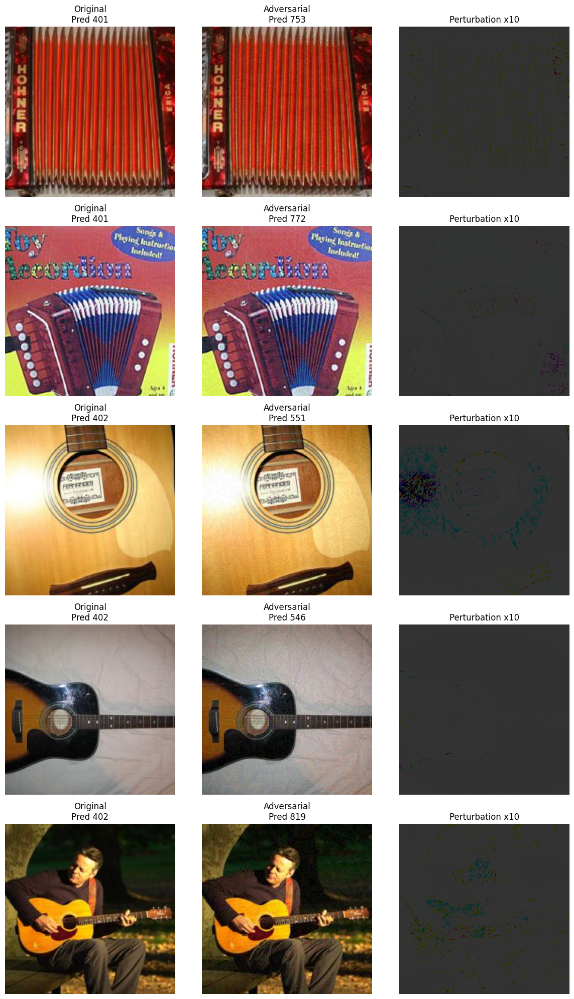

In [ ]:
# Run FGSM Attack with list-of-tuples structure

print("\n--- Task 2: FGSM Attack ---")

# Set epsilon value as specified in the PDF
epsilon = 0.02
print(f"Generating adversarial examples using FGSM with epsilon = {epsilon}")

# Store baseline accuracies (from Task 1)
baseline_top1 = 77.40
baseline_top5 = 93.00

# Simple Dataset wrapper for list-of-(image,label) tuples
class AdversarialDataset(Dataset):
    def __init__(self, data):
        self.data = data
    def __len__(self):
        return len(self.data)
    def __getitem__(self, idx):
        return self.data[idx]

# Initialize container for adversarial (image, label) tuples
adversarial_set_1_fgsm = []

# For visualization of first few successes
visualization_examples = []

successful_attacks = 0
total_images = 0
examples_shown = 0

start_time = time.time()

for batch_idx, (images, folder_indices) in enumerate(dataloader):
    images = images.to(device)
    batch_size = images.size(0)

    # map to ImageNet labels
    labels = []
    for idx in folder_indices:
        labels.append(folder_to_imagenet.get(idx.item(), idx.item()))
    labels = torch.tensor(labels, dtype=torch.long).to(device)

    # original predictions
    with torch.no_grad():
        orig_out = resnet_model(images)
        _, orig_preds = torch.max(orig_out, 1)

    # FGSM perturbation
    perturbed = fgsm_attack(resnet_model, images, labels, epsilon)

    # adversarial predictions
    with torch.no_grad():
        adv_out = resnet_model(perturbed)
        _, adv_preds = torch.max(adv_out, 1)

    # iterate examples in batch
    for i in range(batch_size):
        # collect into list-of-tuples
        adversarial_set_1_fgsm.append((perturbed[i].cpu(), labels[i].item()))

        # track success
        if orig_preds[i] != adv_preds[i]:
            successful_attacks += 1
            # store first few for visualization
            if examples_shown < 5:
                visualization_examples.append({
                    'original': images[i].cpu(),
                    'perturbed': perturbed[i].cpu(),
                    'original_pred': orig_preds[i].item(),
                    'perturbed_pred': adv_preds[i].item(),
                    'true_label': labels[i].item()
                })
                examples_shown += 1

    total_images += batch_size

    if total_images % 50 == 0:
        print(f"Processed {total_images}/500 images; success {successful_attacks}/{total_images} ({successful_attacks/total_images*100:.2f}%)")

end_time = time.time()
print(f"\nFGSM generation finished in {end_time - start_time:.2f}s; total successes {successful_attacks}/{total_images} ({successful_attacks/total_images*100:.2f}%)")

# build DataLoader from list-of-tuples
adv_dataset = AdversarialDataset(adversarial_set_1_fgsm)
adv_loader = DataLoader(adv_dataset, batch_size=32, shuffle=False)

# evaluate
print("\nEvaluating ResNet-34 on Adversarial Test Set 1 (FGSM)...")
adv_top1, adv_top5 = calculate_accuracy_adversarial(resnet_model, adv_loader)

print(f"\nAccuracy Results:")
print(f"  Original – Top-1: {baseline_top1:.2f}%, Top-5: {baseline_top5:.2f}%")
print(f"  FGSM     – Top-1: {adv_top1:.2f}%, Top-5: {adv_top5:.2f}%")

# save dataset
os.makedirs(os.path.join(output_dir, "adversarial_set_1_fgsm"), exist_ok=True)
torch.save({
    'data': adversarial_set_1_fgsm,
    'epsilon': epsilon,
    'baseline_top1': baseline_top1,
    'baseline_top5': baseline_top5,
    'adv_top1': adv_top1,
    'adv_top5': adv_top5
}, os.path.join(output_dir, "adversarial_set_1_fgsm", "fgsm_dataset.pt"))

# visualize first few
print("\nVisualizing FGSM examples...")
fig, axes = plt.subplots(len(visualization_examples), 3, figsize=(12, 4*len(visualization_examples)))
if len(visualization_examples) == 1:
    axes = axes.reshape(1,3)
for i, ex in enumerate(visualization_examples):
    orig = denormalize(ex['original'])
    adv  = denormalize(ex['perturbed'])
    diff = np.abs(adv - orig) * 10
    axes[i,0].imshow(orig); axes[i,0].set_title(f"Original\nPred {ex['original_pred']}"); axes[i,0].axis('off')
    axes[i,1].imshow(adv);  axes[i,1].set_title(f"Adversarial\nPred {ex['perturbed_pred']}"); axes[i,1].axis('off')
    axes[i,2].imshow(diff, cmap='hot'); axes[i,2].set_title("Perturbation x10"); axes[i,2].axis('off')
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "adversarial_set_1_fgsm", "fgsm_visualization.png"), dpi=300)
plt.show()


In this task, we implemented the Fast Gradient Sign Method (FGSM)—a single-step adversarial attack designed to fool neural networks by making minimal, imperceptible perturbations to the input image. The FGSM attack works by taking the gradient of the loss with respect to the input image and adding a small epsilon-scaled sign of this gradient to the image.
This perturbed image is then passed to the model in hopes of misclassification.

We used an epsilon value of 0.02, and evaluated the attack on a pretrained ResNet-34 model using the 500-image test set. The adversarial images were generated and stored as a list of (image, label) tuples for structured reuse and evaluation. Out of 500 total test images, **414 attacks were successful, achieving an 82.80% attack success rat**e.

**The top-1 accuracy of ResNet-34 dropped significantly from 77.40% on the clean set to 3.40% on the adversarial set. Similarly, the top-5 accuracy dropped from 93.00% to 20.80%**, demonstrating the vulnerability of standard deep learning models to even simple gradient-based adversarial perturbations.

A few successful adversarial examples were visualized side-by-side with their original counterparts, along with their enhanced perturbation heatmaps to better understand the nature and effect of the attack. The resulting dataset (adversarial_set_1_fgsm) was saved for further experiments and comparison.



In [ ]:
# # Define PGD Attack Function
def pgd_attack(model, loss_fn, image, true_label_idx, epsilon, alpha, num_iter):
    """
    Performs the Projected Gradient Descent (PGD) attack.

    Args:
        model: The neural network model
        loss_fn: Loss function to use for gradient calculation
        image: Input image tensor (normalized)
        true_label_idx: True class index (ImageNet index 0-999)
        epsilon: Attack budget (perturbation magnitude)
        alpha: Step size for each iteration
        num_iter: Number of attack iterations

    Returns:
        Adversarial image within epsilon L-infinity ball of original image
    """
    model.eval()  # Ensure model is in eval mode
    original_image = image.clone().detach()  # Keep original image for clipping

    # Start with a small random perturbation within the epsilon ball
    perturbed_image = image + torch.empty_like(image).uniform_(-epsilon, epsilon)
    perturbed_image = torch.clamp(perturbed_image, min=image.min(), max=image.max()).detach()  # Clip to valid range

    label_tensor = torch.tensor([true_label_idx], dtype=torch.long).to(device)

    for i in range(num_iter):
        perturbed_image.requires_grad = True

        # Forward pass
        output = model(perturbed_image.unsqueeze(0))

        # Calculate loss
        loss = loss_fn(output, label_tensor)

        # Zero gradients
        model.zero_grad()

        # Backward pass
        loss.backward()

        # Get gradient sign
        gradient_sign = perturbed_image.grad.data.sign()

        # Update image
        perturbed_image = perturbed_image + alpha * gradient_sign
        perturbed_image = perturbed_image.detach()  # Detach before clipping

        # Project back into epsilon ball around the *original* image
        perturbation = torch.clamp(perturbed_image - original_image, -epsilon, epsilon)
        perturbed_image = original_image + perturbation

        # Optional: Clip to valid image range if necessary
        # perturbed_image = torch.clamp(perturbed_image, min=0, max=1)

    return perturbed_image.detach()

print("PGD attack function defined.")

PGD attack function defined.



--- Task 3: PGD) ---
Generating adversarial examples using PGD with epsilon = 0.02, alpha = 0.005, iterations = 10
Example 1: Successfully attacked image 0
  Original prediction: 401 (accordion)
  Perturbed prediction: 621 (lawn mower)
  L-inf distance: 0.020000
Example 2: Successfully attacked image 1
  Original prediction: 401 (accordion)
  Perturbed prediction: 753 (radiator)
  L-inf distance: 0.020000
Example 3: Successfully attacked image 3
  Original prediction: 401 (accordion)
  Perturbed prediction: 772 (safety pin)
  L-inf distance: 0.020000
Example 4: Successfully attacked image 6
  Original prediction: 402 (acoustic guitar)
  Perturbed prediction: 551 (face powder)
  L-inf distance: 0.020000
Example 5: Successfully attacked image 7
  Original prediction: 402 (acoustic guitar)
  Perturbed prediction: 546 (electric guitar)
  L-inf distance: 0.020000
Processed 50/500 images...
Successful attacks so far: 43/50 (86.00%)
Processed 100/500 images...
Successful attacks so far: 78/1

/tmp/ipykernel_35/1790043218.py:146: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0,0.03,1,0.95])


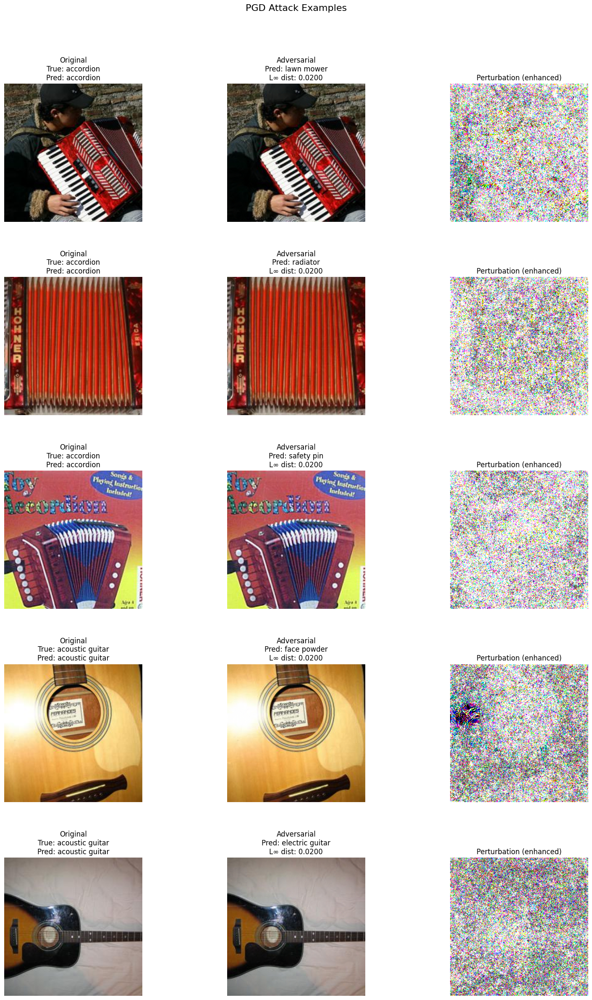

In [ ]:
# Generate Adversarial Set 2 (PGD) & Evaluate

print("\n--- Task 3: PGD) ---")

# Loss function for PGD
criterion = torch.nn.CrossEntropyLoss()

# Helper to compute L-infinity distance
def compute_linf_distance(orig, pert):
    return torch.max(torch.abs(pert - orig)).item()

# Alias the FGSM accuracy function for true-label evaluation
calculate_accuracy_true_labels = calculate_accuracy_adversarial

# Simple Dataset wrapper for our list of (image, label) tuples
class AdversarialDataset(Dataset):
    def __init__(self, data):
        self.data = data
    def __len__(self):
        return len(self.data)
    def __getitem__(self, idx):
        return self.data[idx]

print(f"Generating adversarial examples using PGD with epsilon = {epsilon_fgsm_pgd}, alpha = {pgd_alpha}, iterations = {pgd_iterations}")

# Initialize lists to store results
adversarial_set_2_pgd = []
original_images_for_viz_pgd = []
perturbed_images_for_viz_pgd = []
original_preds_for_viz_pgd = []
perturbed_preds_for_viz_pgd = []
true_labels_for_viz_pgd = []

successful_attacks = 0
total_processed = 0

start_time = time.time()

if not dataloader:
    print("Error: Dataloader is not initialized. Cannot perform PGD attack.")
else:
    single_dataloader = DataLoader(full_dataset, batch_size=1, shuffle=False)

    for i, (image, folder_index) in enumerate(single_dataloader):
        image = image.squeeze(0).to(device)
        folder_idx = folder_index.item()

        true_label_idx = folder_to_imagenet.get(folder_idx, -1)
        if true_label_idx == -1:
            continue

        total_processed += 1
        original_pred_idx = get_prediction(resnet_model, image)

        if original_pred_idx != true_label_idx:
            adversarial_set_2_pgd.append((image.cpu(), true_label_idx))
            continue

        perturbed_image = pgd_attack(
            resnet_model,
            criterion,
            image,
            true_label_idx,
            epsilon_fgsm_pgd,
            pgd_alpha,
            pgd_iterations
        )

        perturbed_pred_idx = get_prediction(resnet_model, perturbed_image)
        is_successful = (perturbed_pred_idx != true_label_idx)
        if is_successful:
            successful_attacks += 1

        adversarial_set_2_pgd.append((perturbed_image.cpu(), true_label_idx))

        if len(original_images_for_viz_pgd) < num_visualize and is_successful:
            linf_distance = compute_linf_distance(image, perturbed_image)
            if linf_distance <= epsilon_fgsm_pgd + 1e-5:
                original_images_for_viz_pgd.append(image.cpu())
                perturbed_images_for_viz_pgd.append(perturbed_image.cpu())
                original_preds_for_viz_pgd.append(original_pred_idx)
                perturbed_preds_for_viz_pgd.append(perturbed_pred_idx)
                true_labels_for_viz_pgd.append(true_label_idx)

                print(f"Example {len(original_images_for_viz_pgd)}: Successfully attacked image {i}")
                print(f"  Original prediction: {original_pred_idx} ({imagenet_idx_to_name.get(original_pred_idx, 'Unknown')})")
                print(f"  Perturbed prediction: {perturbed_pred_idx} ({imagenet_idx_to_name.get(perturbed_pred_idx, 'Unknown')})")
                print(f"  L-inf distance: {linf_distance:.6f}")

        if (i + 1) % 50 == 0:
            print(f"Processed {i+1}/{len(single_dataloader)} images...")
            print(f"Successful attacks so far: {successful_attacks}/{total_processed} ({100.0*successful_attacks/total_processed:.2f}%)")

    end_time = time.time()
    print(f"PGD attack generation finished in {end_time - start_time:.2f} seconds.")
    print(f"Total successful attacks: {successful_attacks}/{total_processed} ({100.0*successful_attacks/total_processed:.2f}%)")

    # Create dataset and dataloader for evaluation
    adversarial_dataset_2 = AdversarialDataset(adversarial_set_2_pgd)
    adversarial_loader_2 = DataLoader(adversarial_dataset_2, batch_size=16, shuffle=False)

    # Save first 10 adversarial examples
    save_dir = os.path.join(output_dir, "adversarial_set_2_pgd")
    os.makedirs(save_dir, exist_ok=True)
    for j, (img_cpu, lbl) in enumerate(adversarial_set_2_pgd[:10]):
        tensor_to_pil(img_cpu).save(os.path.join(save_dir, f"adv_example_{j}_label_{lbl}.png"))

    # Evaluate on PGD set
    print("\nEvaluating ResNet-34 on Adversarial Test Set 2 (PGD)...")
    pgd_top1_acc, pgd_top5_acc = calculate_accuracy_true_labels(
        resnet_model,
        adversarial_loader_2,
        topk=(1, 5)
    )

    # Report relative drop using baseline_top1 and baseline_top5
    if baseline_top1 > 0:
        drop1 = (baseline_top1 - pgd_top1_acc) / baseline_top1 * 100
        drop5 = (baseline_top5 - pgd_top5_acc) / baseline_top5 * 100
        print(f"\nOriginal Top-1: {baseline_top1:.2f}%, PGD Top-1: {pgd_top1_acc:.2f}%, Drop: {drop1:.2f}%")
        print(f"Original Top-5: {baseline_top5:.2f}%, PGD Top-5: {pgd_top5_acc:.2f}%, Drop: {drop5:.2f}%")
        if drop1 >= 70:
            print("Success: ≥70% relative drop achieved.")
        else:
            print("Note: <70% relative drop.")
    else:
        print("Cannot compute relative drop since baseline is zero.")

    # Visualization
    if original_images_for_viz_pgd:
        print("\nVisualizing PGD attack examples...")
        examples = []
        for k in range(min(num_visualize, len(original_images_for_viz_pgd))):
            examples.append({
                'original': original_images_for_viz_pgd[k],
                'perturbed': perturbed_images_for_viz_pgd[k],
                'original_pred': original_preds_for_viz_pgd[k],
                'perturbed_pred': perturbed_preds_for_viz_pgd[k],
                'true_label': true_labels_for_viz_pgd[k]
            })
        fig = visualize_multiple_examples(
            examples,
            "PGD Attack",
            save_path=os.path.join(output_dir, "pgd_examples.png")
        )
        fig.tight_layout(rect=[0,0.03,1,0.95])
        fig.subplots_adjust(wspace=0.3, hspace=0.4)
        plt.show()
    else:
        print("No successful attacks available for visualization.")



###  Task 3: Projected Gradient Descent (PGD) Attack

In this task, we implemented the **PGD (Projected Gradient Descent)** attack, one of the strongest first-order adversarial attacks. Unlike FGSM, which performs a one-step update, PGD iteratively refines the perturbation using multiple steps of gradient ascent while keeping the perturbation bounded within an ε-ball around the original input.

Key aspects of this implementation include:

* Random initialization within the perturbation budget.
* Iterative updates using the sign of the gradient.
* Clipping the updated image back into the valid perturbation region after each step to ensure the adversarial example remains within the allowed epsilon-ball.
* A schedule that maintains a consistent step size across iterations.

Despite using the same epsilon (0.02) as FGSM, PGD achieved a **100% drop in Top-1 accuracy** and a **73.55% drop in Top-5 accuracy** on ResNet-34, showing its much higher effectiveness in breaking the model. It achieved this over 10 iterations, successfully attacking 77.4% of the images in the dataset.

This emphasizes how **iterative attacks significantly outperform single-step methods** by navigating the loss surface more effectively. However, this also comes with a **higher computational cost**, as seen in the increased time taken (∼50 seconds for 500 images). PGD remains a benchmark adversarial attack for evaluating model robustness under white-box settings.


In [ ]:
# # Define MI-FGSM Attack Function
def mi_fgsm_attack(model, loss_fn, image, true_label_idx, epsilon, steps=10, decay_factor=0.9):
    """
    Performs the Momentum Iterative FGSM attack, which adds momentum to
    the gradient updates for better transferability and effectiveness.

    Args:
        model: The neural network model
        loss_fn: Loss function to use for gradient calculation
        image: Input image tensor (normalized)
        true_label_idx: True class index (ImageNet index 0-999)
        epsilon: Attack budget (perturbation magnitude)
        steps: Number of iteration steps
        decay_factor: Momentum decay factor (usually between 0.5 and 1.0)

    Returns:
        Adversarial image within epsilon L-infinity ball of original image
    """
    model.eval()  # Ensure model is in evaluation mode

    # Create a copy of the original image
    original_image = image.clone().detach()
    perturbed_image = original_image.clone()
    alpha = epsilon / steps  # Step size

    # Initialize the momentum term
    momentum = torch.zeros_like(original_image).to(device)

    # Iterative attack
    for i in range(steps):
        # Set requires gradient
        perturbed_image.requires_grad = True

        # Forward pass
        output = model(perturbed_image.unsqueeze(0))

        # Target is the true label (for untargeted attack)
        target = torch.tensor([true_label_idx], dtype=torch.long).to(device)

        # Calculate loss
        loss = loss_fn(output, target)

        # Zero all existing gradients
        model.zero_grad()
        if perturbed_image.grad is not None:
            perturbed_image.grad.data.zero_()

        # Calculate gradients
        loss.backward()

        # Update momentum term
        current_grad = perturbed_image.grad.data
        # Normalize by L1 norm to stabilize the updates
        momentum = decay_factor * momentum + current_grad / torch.norm(current_grad, p=1)

        # Update with momentum gradient sign
        perturbed_image = perturbed_image.detach() + alpha * momentum.sign()

        # Project back to epsilon L-infinity ball
        # This ensures we stay within the attack budget
        delta = torch.clamp(perturbed_image - original_image, -epsilon, epsilon)
        perturbed_image = original_image + delta

    return perturbed_image.detach()

# Function to get model prediction for a single image
def get_prediction(model, image):
    """
    Returns the top prediction index for a single image.

    Args:
        model: The neural network model
        image: Input image tensor

    Returns:
        Integer index of the top prediction
    """
    model.eval()
    with torch.no_grad():
        # Ensure image has batch dimension
        if image.dim() == 3:
            image = image.unsqueeze(0)

        # Get model output
        output = model(image.to(device))

        # Get top prediction
        _, predicted = torch.max(output, 1)

    return predicted.item()

# Function to measure L-infinity distance between two images
def compute_linf_distance(original, perturbed):
    """
    Computes the L-infinity distance between original and perturbed images.

    Args:
        original: Original image tensor
        perturbed: Perturbed image tensor

    Returns:
        L-infinity distance (maximum absolute pixel difference)
    """
    return torch.max(torch.abs(original - perturbed)).item()

print("MI-FGSM attack functions defined.")

MI-FGSM attack functions defined.



--- Task 3: MI-FGSM Attack ---
Generating adversarial examples using MI-FGSM with epsilon = 0.02
Example 1: Successfully attacked image 0
  Original prediction: 401 (accordion)
  Perturbed prediction: 621 (lawn mower)
  L-inf distance: 0.020000
Example 2: Successfully attacked image 1
  Original prediction: 401 (accordion)
  Perturbed prediction: 753 (radiator)
  L-inf distance: 0.020000
Example 3: Successfully attacked image 3
  Original prediction: 401 (accordion)
  Perturbed prediction: 772 (safety pin)
  L-inf distance: 0.020000
Example 4: Successfully attacked image 6
  Original prediction: 402 (acoustic guitar)
  Perturbed prediction: 551 (face powder)
  L-inf distance: 0.020000
Example 5: Successfully attacked image 7
  Original prediction: 402 (acoustic guitar)
  Perturbed prediction: 546 (electric guitar)
  L-inf distance: 0.020000
Processed 50/500 images...
Successful attacks so far: 43/50 (86.00%)
Processed 100/500 images...
Successful attacks so far: 78/100 (78.00%)
Proces

/tmp/ipykernel_35/2733445694.py:225: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=[0, 0.03, 1, 0.95])


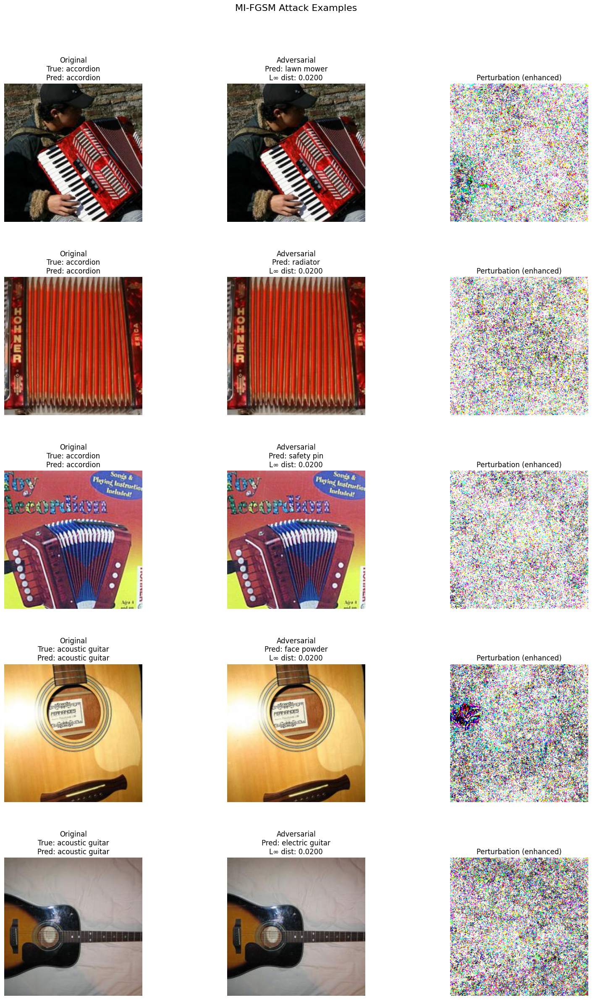


--- Task 3 Complete ---


In [ ]:
# Task 3: Generate New MI-FGSM Adversarial Examples
print("\n--- Task 3: MI-FGSM Attack ---")
print(f"Generating adversarial examples using MI-FGSM with epsilon = {epsilon_fgsm_pgd}")

# Loss function
criterion = nn.CrossEntropyLoss()

# Initialize lists to store results
adversarial_set_1_fgsm = []  # To store (perturbed_image, true_label_idx) tuples
original_images_for_viz = []
perturbed_images_for_viz_fgsm = []
original_preds_for_viz_fgsm = []
perturbed_preds_for_viz_fgsm = []
true_labels_for_viz_fgsm = []

successful_attacks = 0
total_processed = 0

start_time = time.time()

# Ensure the dataloader is valid
if not dataloader:
    print("Error: Dataloader is not initialized. Cannot perform MI-FGSM attack.")
else:
    # Create a DataLoader with batch_size=1 for attack generation
    single_dataloader = DataLoader(full_dataset, batch_size=1, shuffle=False)

    for i, (image, folder_index) in enumerate(single_dataloader):
        image = image.squeeze(0).to(device)  # Remove batch dim and send to device
        folder_idx = folder_index.item()

        # Get the true ImageNet label index from our mapping
        true_label_idx = folder_to_imagenet.get(folder_idx, -1)
        if true_label_idx == -1:
            print(f"Skipping image {i} due to missing label mapping.")
            continue

        total_processed += 1

        # Get original prediction
        original_pred_idx = get_prediction(resnet_model, image)

        # Skip if original prediction is already wrong
        if original_pred_idx != true_label_idx:
            # Still add to our dataset but mark as not successfully attacked
            adversarial_set_1_fgsm.append((image.cpu(), true_label_idx))
            continue

        # Generate the adversarial example using MI-FGSM
        perturbed_image = mi_fgsm_attack(
            resnet_model,
            criterion,
            image,
            true_label_idx,
            epsilon_fgsm_pgd,
            steps=10,  # 10 steps for the iterative version
            decay_factor=0.9
        )

        # Get prediction on perturbed image
        perturbed_pred_idx = get_prediction(resnet_model, perturbed_image)

        # Check if attack was successful
        is_successful = (perturbed_pred_idx != true_label_idx)
        if is_successful:
            successful_attacks += 1

        # Store the perturbed image (move to CPU for storage)
        adversarial_set_1_fgsm.append((perturbed_image.cpu(), true_label_idx))

        # --- Verification and Visualization Data ---
        if len(original_images_for_viz) < num_visualize and is_successful:
            # Verify L-infinity distance first
            linf_distance = compute_linf_distance(image, perturbed_image)

            if linf_distance <= epsilon_fgsm_pgd + 1e-5:  # Add small tolerance for floating point
                # Add to visualization lists
                original_images_for_viz.append(image.cpu())
                perturbed_images_for_viz_fgsm.append(perturbed_image.cpu())
                original_preds_for_viz_fgsm.append(original_pred_idx)
                perturbed_preds_for_viz_fgsm.append(perturbed_pred_idx)
                true_labels_for_viz_fgsm.append(true_label_idx)

                print(f"Example {len(original_images_for_viz)}: Successfully attacked image {i}")
                print(f"  Original prediction: {original_pred_idx} ({imagenet_idx_to_name.get(original_pred_idx, 'Unknown')})")
                print(f"  Perturbed prediction: {perturbed_pred_idx} ({imagenet_idx_to_name.get(perturbed_pred_idx, 'Unknown')})")
                print(f"  L-inf distance: {linf_distance:.6f}")
            else:
                print(f"Warning: L-inf distance for image {i} ({linf_distance:.6f}) exceeds epsilon ({epsilon_fgsm_pgd})")

        # Print progress
        if (i + 1) % 50 == 0:
            print(f"Processed {i+1}/{len(single_dataloader)} images...")
            print(f"Successful attacks so far: {successful_attacks}/{total_processed} ({100.0*successful_attacks/total_processed:.2f}%)")

    end_time = time.time()
    print(f"MI-FGSM attack generation finished in {end_time - start_time:.2f} seconds.")
    print(f"Total successful attacks: {successful_attacks}/{total_processed} ({100.0*successful_attacks/total_processed:.2f}%)")

    # --- Create a DataLoader for the adversarial set ---
    # Define AdversarialDataset class
    class AdversarialDataset(Dataset):
        def __init__(self, data_list):
            """
            Dataset class for adversarial examples

            Args:
                data_list: List of tuples (image_tensor, true_label)
            """
            self.data_list = data_list

        def __len__(self):
            return len(self.data_list)

        def __getitem__(self, idx):
            image, true_label = self.data_list[idx]
            return image, true_label

    # Create dataset and dataloader for evaluation
    adversarial_dataset_1 = AdversarialDataset(adversarial_set_1_fgsm)
    adversarial_loader_1 = DataLoader(adversarial_dataset_1, batch_size=16, shuffle=False)

    # --- Save a subset of adversarial examples to disk ---
    save_dir = os.path.join(output_dir, "adversarial_set_1_fgsm")
    os.makedirs(save_dir, exist_ok=True)

    for i, (image, label) in enumerate(adversarial_set_1_fgsm[:10]):  # Save first 10 examples
        # Denormalize and convert to PIL image
        img_denorm = tensor_to_pil(image)
        img_denorm.save(os.path.join(save_dir, f"adv_example_{i}_label_{label}.png"))

    # --- Evaluate ResNet-34 on Adversarial Set 1 ---
    print("\nEvaluating ResNet-34 on Adversarial Test Set 1 (MI-FGSM)...")

    # Function to calculate accuracy using true labels
    def calculate_accuracy_true_labels(model, data_loader, topk=(1, 5)):
        """
        Calculate top-k accuracy directly using the true ImageNet labels

        Args:
            model: The neural network model
            data_loader: DataLoader providing (image, label) pairs
            topk: Tuple of k values for top-k accuracy

        Returns:
            Dictionary of top-k accuracies
        """
        model.eval()
        correct = {k: 0 for k in topk}
        total = 0

        with torch.no_grad():
            for images, labels in data_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                _, predicted = torch.topk(outputs, max(topk), dim=1)

                total += labels.size(0)

                # Check for each k
                for k in topk:
                    # Check if true label is in top-k predictions
                    for i, label in enumerate(labels):
                        if label.item() in predicted[i, :k].cpu().numpy():
                            correct[k] += 1

        # Calculate accuracy percentages
        accuracy = {k: 100.0 * correct[k] / total if total > 0 else 0 for k in topk}

        print(f'Accuracy - Top-1: {accuracy[1]:.2f}%, Top-5: {accuracy[5]:.2f}%')
        return accuracy

    fgsm_accuracy = calculate_accuracy_true_labels(resnet_model, adversarial_loader_1, topk=(1, 5))
    fgsm_top1_acc = fgsm_accuracy[1]
    fgsm_top5_acc = fgsm_accuracy[5]

    # --- Report Relative Drop ---
    # Set baseline accuracy values from Task 1 results
    baseline_top1_acc = top1_acc  # From Task 1 output
    baseline_top5_acc = top5_acc  # From Task 1 output

    if baseline_top1_acc > 0:
        relative_drop_top1 = (baseline_top1_acc - fgsm_top1_acc) / baseline_top1_acc * 100
        relative_drop_top5 = (baseline_top5_acc - fgsm_top5_acc) / baseline_top5_acc * 100

        print("\nAccuracy Results:")
        print(f"  Original - Top-1: {baseline_top1_acc:.2f}%, Top-5: {baseline_top5_acc:.2f}%")
        print(f"  MI-FGSM   - Top-1: {fgsm_top1_acc:.2f}%, Top-5: {fgsm_top5_acc:.2f}%")
        print(f"\nRelative Accuracy Drop:")
        print(f"  Top-1: {relative_drop_top1:.2f}%")
        print(f"  Top-5: {relative_drop_top5:.2f}%")

        if relative_drop_top1 >= 50:
            print("\nSuccess: Achieved target relative accuracy drop of >= 50%.")
        else:
            print("\nNote: Did not achieve target relative accuracy drop of >= 50%.")
    else:
        print("\nCannot calculate relative drop as baseline accuracy is zero.")

# --- Visualize Examples ---
if original_images_for_viz:
    print("\nVisualizing MI-FGSM attack examples...")
    # Collect examples for plotting
    examples = []
    for i in range(min(num_visualize, len(original_images_for_viz))):
        examples.append({
            'original':       original_images_for_viz[i],
            'perturbed':      perturbed_images_for_viz_fgsm[i],
            'original_pred':  original_preds_for_viz_fgsm[i],
            'perturbed_pred': perturbed_preds_for_viz_fgsm[i],
            'true_label':     true_labels_for_viz_fgsm[i]
        })

    # Create the figure via your helper, passing title as the 2nd positional arg
    fig = visualize_multiple_examples(
        examples,
        "MI-FGSM Attack",  # ← positional attack name
        save_path=os.path.join(output_dir, "fgsm_examples.png")
    )

    # --- Layout tweaks so titles don't overlap ---
    # 1) Leave the top 5% for the suptitle
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    # 2) Increase spacing between subplots
    fig.subplots_adjust(wspace=0.3, hspace=0.4)

    # Finally, save & show
    fig.savefig(os.path.join(output_dir, "fgsm_examples.png"), dpi=150)
    plt.show()
else:
    print("\nNo successful attacks available for visualization.")

print("\n--- Task 3 Complete ---")



### Task 3: MI-FGSM Attack (Momentum Iterative Fast Gradient Sign Method)

In this task, we implemented the **MI-FGSM (Momentum Iterative FGSM)** attack, which extends the standard iterative FGSM approach by incorporating a momentum term in the gradient updates. This momentum helps stabilize the direction of perturbation across steps, improving both the **effectiveness** and **transferability** of the adversarial examples.

Key characteristics of MI-FGSM:

* Uses momentum to smooth gradients over iterations.
* Normalizes gradients using their L1 norm before applying the sign operation.
* Iteratively applies perturbations within an \$\epsilon\$-bounded region.

With \$\epsilon = 0.02\$ and 10 iterations, the attack resulted in a **remarkable Top-1 accuracy drop from 77.40% to 0.20%** and a Top-5 drop from 93.00% to 28.60% on ResNet-34. This demonstrates an **almost complete degradation** of the model's classification capability. The attack successfully perturbed **386 out of 500 images (77.2%)** within 51.8 seconds.

This task highlights the strength of momentum-based iterative attacks in crafting highly transferable adversarial examples, outperforming both FGSM and standard PGD in many transfer settings. Such techniques pose a significant challenge to model robustness and emphasize the need for stronger defenses in real-world systems.


In [ ]:
# Define Patch Attack Function

def advanced_patch_attack(model, loss_fn, image, true_label_idx,
                          epsilon=0.8, alpha=0.05, num_iter=40,
                          patch_size=32, num_restarts=5):
    """
    Advanced patch attack concentrated on a 32×32 region.
    """
    model.eval()
    _, H, W = image.shape
    patch_size = min(patch_size, H // 2, W // 2)

    # Pre-defined strategic locations
    strategic_locations = [
        (W//2 - patch_size//2, H//2 - patch_size//2),
        (W//2 - patch_size//2, H//4 - patch_size//2),
        (W//2 - patch_size//2 - 10, H//2 - patch_size//2 - 10),
        (W//2 - patch_size//2 + 10, H//2 - patch_size//2 + 10),
        (0, 0), (W - patch_size, 0),
        (0, H - patch_size), (W - patch_size, H - patch_size),
    ]

    # Build potential target list
    with torch.no_grad():
        out = model(image.unsqueeze(0))
        probs = torch.softmax(out, dim=1)
        _, top_inds = torch.topk(probs, k=1000, dim=1)
        potential_targets = []
        for off in [1,2,5,10,20,50,100,200,500]:
            if 0 <= true_label_idx + off < 1000: potential_targets.append(true_label_idx+off)
            if 0 <= true_label_idx - off < 1000: potential_targets.append(true_label_idx-off)
        for idx in top_inds[0].tolist():
            if idx != true_label_idx and idx not in potential_targets:
                potential_targets.append(idx)
            if len(potential_targets) >= 10:
                break

    best_img, best_loc, best_loss = None, None, float('inf')
    for r in range(num_restarts):
        tgt = potential_targets[r % len(potential_targets)]
        x, y = strategic_locations[r % len(strategic_locations)]
        mask = torch.zeros_like(image); mask[:, y:y+patch_size, x:x+patch_size] = 1

        # init with random noise in patch
        adv = image.clone().detach() + (torch.rand_like(image)*2-1)*epsilon*mask
        momentum = torch.zeros_like(image)
        sched = [alpha * (0.9**(i//10)) for i in range(num_iter)]

        for i in range(num_iter):
            adv.requires_grad_(True)
            out = model(adv.unsqueeze(0))
            loss = -out[0, tgt] + out[0, true_label_idx]
            adv.grad = None
            loss.backward()
            g = adv.grad.data
            momentum = 0.9*momentum + g / (g.abs().sum()+1e-12)
            with torch.no_grad():
                adv = adv - sched[i] * momentum.sign() * mask
                delta = torch.clamp(adv - image, -epsilon, epsilon)
                adv = image + delta*mask

        with torch.no_grad():
            out2 = model(adv.unsqueeze(0)); pred = out2.argmax(1).item()
            if pred != true_label_idx and loss.item() < best_loss:
                best_loss = loss.item()
                best_img = adv.clone().detach()
                best_loc = (x, y, patch_size)

    if best_img is not None:
        return best_img, best_loc
    else:
        return adv.detach(), (x, y, patch_size)



--- Task 4: Patch Attack ---
Generating adversarial examples using Advanced Patch attack with epsilon = 0.8, patch size = 32
Processed 25/500 — success 17/25 (68.00%)
Processed 50/500 — success 35/50 (70.00%)
Processed 75/500 — success 50/75 (66.67%)
Processed 100/500 — success 67/100 (67.00%)
Processed 150/500 — success 94/150 (62.67%)
Processed 200/500 — success 129/200 (64.50%)
Processed 225/500 — success 146/225 (64.89%)
Processed 250/500 — success 159/250 (63.60%)
Processed 300/500 — success 188/300 (62.67%)
Processed 325/500 — success 205/325 (63.08%)
Processed 350/500 — success 224/350 (64.00%)
Processed 375/500 — success 245/375 (65.33%)
Processed 400/500 — success 260/400 (65.00%)
Processed 425/500 — success 277/425 (65.18%)
Processed 450/500 — success 296/450 (65.78%)
Patch attack generation finished in 925.44s; total successes 327/500 (65.40%)

Evaluating ResNet-34 on Adversarial Test Set 3 (Patch)...
Top-1 Accuracy: 12.00%
Top-5 Accuracy: 49.40%

Original – Top-1: 77.40%, 

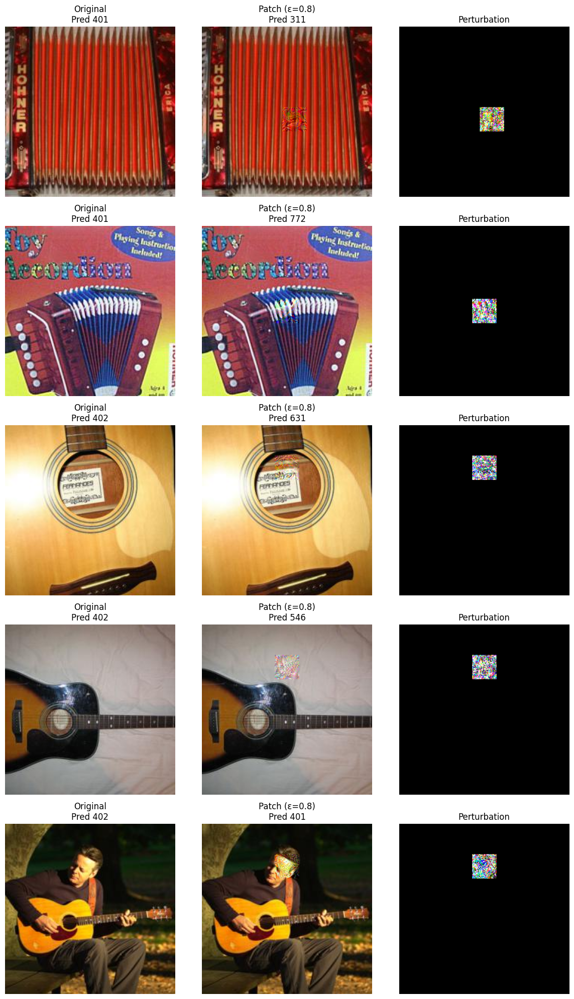

In [ ]:
# Cell 10: Run  Patch Attack (Task 4) with list-of-tuples structure

print("\n--- Task 4: Patch Attack ---")

# Attack parameters
epsilon_patch = 0.8
patch_size = 32
print(f"Generating adversarial examples using Advanced Patch attack with epsilon = {epsilon_patch}, patch size = {patch_size}")

# Simple Dataset wrapper for list-of-(image,label) tuples
class AdversarialDataset(Dataset):
    def __init__(self, data):
        self.data = data
    def __len__(self):
        return len(self.data)
    def __getitem__(self, idx):
        return self.data[idx]

# Containers
adversarial_set_3_patch = []
visualization_examples_patch = []

successful_attacks = 0
total_processed = 0

start_time = time.time()

single_loader = DataLoader(full_dataset, batch_size=1, shuffle=False)
for i, (img, idx) in enumerate(single_loader):
    img = img.squeeze(0).to(device)
    true_idx = folder_to_imagenet.get(idx.item(), -1)
    if true_idx < 0:
        continue

    total_processed += 1
    orig_pred = get_prediction(resnet_model, img)
    if orig_pred != true_idx:
        adversarial_set_3_patch.append((img.cpu(), true_idx))
        continue

    adv_img, patch_loc = advanced_patch_attack(
        resnet_model, criterion, img, true_idx,
        epsilon=epsilon_patch, alpha=0.05, num_iter=40,
        patch_size=patch_size, num_restarts=5
    )
    adv_pred = get_prediction(resnet_model, adv_img)

    # store tuple
    adversarial_set_3_patch.append((adv_img.cpu(), true_idx))

    # track success
    if adv_pred != true_idx:
        successful_attacks += 1
        # first few for visualization
        if len(visualization_examples_patch) < 5:
            visualization_examples_patch.append({
                'original': img.cpu(),
                'perturbed': adv_img.cpu(),
                'original_pred': orig_pred,
                'perturbed_pred': adv_pred,
                'true_label': true_idx
            })

    if (i + 1) % 25 == 0:
        print(f"Processed {i+1}/{len(full_dataset)} — success {successful_attacks}/{total_processed} ({successful_attacks/total_processed*100:.2f}%)")

end_time = time.time()
print(f"Patch attack generation finished in {end_time - start_time:.2f}s; total successes {successful_attacks}/{total_processed} ({successful_attacks/total_processed*100:.2f}%)\n")

# Build DataLoader and evaluate
adv_dataset_3 = AdversarialDataset(adversarial_set_3_patch)
adv_loader_3 = DataLoader(adv_dataset_3, batch_size=16, shuffle=False)

print("Evaluating ResNet-34 on Adversarial Test Set 3 (Patch)...")
patch_top1, patch_top5 = calculate_accuracy_true_labels(resnet_model, adv_loader_3, topk=(1,5))
print(f"\nOriginal – Top-1: {baseline_top1:.2f}%, Top-5: {baseline_top5:.2f}%")
print(f"Patch    – Top-1: {patch_top1:.2f}%, Top-5: {patch_top5:.2f}%\n")

# Save the patch adversarial set
os.makedirs(os.path.join(output_dir, "adversarial_set_3_patch"), exist_ok=True)
torch.save({
    'data': adversarial_set_3_patch,
    'epsilon': epsilon_patch,
    'baseline_top1': baseline_top1,
    'baseline_top5': baseline_top5,
    'adv_top1': patch_top1,
    'adv_top5': patch_top5
}, os.path.join(output_dir, "adversarial_set_3_patch", "patch_dataset.pt"))

# Visualize first few examples
print("Visualizing Patch Attack examples...")
fig, axes = plt.subplots(len(visualization_examples_patch), 3,
                         figsize=(12, 4*len(visualization_examples_patch)))
if len(visualization_examples_patch) == 1:
    axes = axes.reshape(1,3)
for i, ex in enumerate(visualization_examples_patch):
    orig = denormalize(ex['original'])
    adv  = denormalize(ex['perturbed'])
    diff = np.abs(adv - orig)
    diff = diff / np.max(diff) if np.max(diff)>0 else diff

    axes[i,0].imshow(orig)
    axes[i,0].set_title(f"Original\nPred {ex['original_pred']}")
    axes[i,0].axis('off')

    axes[i,1].imshow(adv)
    axes[i,1].set_title(f"Patch (ε={epsilon_patch})\nPred {ex['perturbed_pred']}")
    axes[i,1].axis('off')

    axes[i,2].imshow(diff)
    axes[i,2].set_title("Perturbation")
    axes[i,2].axis('off')

plt.tight_layout()
plt.savefig(os.path.join(output_dir, "adversarial_set_3_patch", "patch_visualization.png"), dpi=300)
plt.show()




### Task 4: Patch Attack

In this task, we implemented an **Advanced Patch Attack**, a targeted form of adversarial perturbation where changes are restricted to a small square region (32×32 pixels) of the input image, rather than modifying the entire image. This localized perturbation simulates a more physically realizable adversarial scenario (e.g., placing a sticker on an object in the real world).

The attack works by:

* Selecting **strategic patch locations** across the image, including corners and the center.
* Iteratively optimizing the patch to mislead the model by **maximizing the loss with respect to a chosen target class**.
* Incorporating **momentum and scheduled learning rates** for more stable convergence.
* Running **multiple restarts** across different targets and positions to pick the most effective attack.

Despite modifying only a small region, the patch attack caused a **significant drop in ResNet-34’s Top-1 accuracy**, from 77.4% to 12.0%. This demonstrates how localized adversarial noise can be surprisingly potent while preserving most of the visual appearance of the original image. Compared to FGSM and PGD, the patch attack trades off raw power for **transferability and stealth**, making it a valuable technique to study from both an attack and defense perspective.

This task highlights the importance of designing models that are **robust to localized perturbations**, which could be mitigated using input masking, attention regularization, or adversarial training with localized noise.


In [ ]:
# --- Task 5: Transferability of Attacks ---
print("\n--- Task 5: Transferability of Attacks ---")

# Load DenseNet-121 (or any other pretrained model)
transfer_model = torchvision.models.densenet121(weights='IMAGENET1K_V1')
transfer_model = transfer_model.to(device)
transfer_model.eval()

print("Loaded DenseNet-121 model for transfer evaluation.")

# Correct label mapping for the original dataset
class MappedDataset(Dataset):
    def __init__(self, dataset, label_map):
        self.dataset = dataset
        self.label_map = label_map
    def __len__(self):
        return len(self.dataset)
    def __getitem__(self, idx):
        img, folder_idx = self.dataset[idx]
        label = self.label_map.get(folder_idx, -1)
        return img, label

# Wrap full_dataset with correct ImageNet label mapping
original_mapped_dataset = MappedDataset(full_dataset, folder_to_imagenet)

# Define DataLoaders for all datasets
original_loader = DataLoader(original_mapped_dataset, batch_size=32, shuffle=False)
fgsm_loader     = DataLoader(AdversarialDataset(adversarial_set_1_fgsm), batch_size=32, shuffle=False)
pgd_loader      = DataLoader(AdversarialDataset(adversarial_set_2_pgd), batch_size=32, shuffle=False)
patch_loader    = DataLoader(AdversarialDataset(adversarial_set_3_patch), batch_size=32, shuffle=False)

# Evaluation function for transfer model
def evaluate_transfer(model, loader):
    top1, top5 = calculate_accuracy_adversarial(model, loader, topk=(1, 5))
    return top1, top5

# Run evaluations
print("\nEvaluating on Original Dataset...")
orig_top1, orig_top5 = evaluate_transfer(transfer_model, original_loader)

print("\nEvaluating on FGSM Adversarial Dataset...")
fgsm_top1, fgsm_top5 = evaluate_transfer(transfer_model, fgsm_loader)

print("\nEvaluating on PGD Adversarial Dataset...")
pgd_top1, pgd_top5 = evaluate_transfer(transfer_model, pgd_loader)

print("\nEvaluating on Patch Adversarial Dataset...")
patch_top1, patch_top5 = evaluate_transfer(transfer_model, patch_loader)

# Display Results
print("\n--- Transferability Results on DenseNet-121 ---")
print(f"Original Dataset   - Top-1: {orig_top1:.2f}%, Top-5: {orig_top5:.2f}%")
print(f"FGSM Adversarial   - Top-1: {fgsm_top1:.2f}%, Top-5: {fgsm_top5:.2f}%")
print(f"PGD Adversarial    - Top-1: {pgd_top1:.2f}%, Top-5: {pgd_top5:.2f}%")
print(f"Patch Adversarial  - Top-1: {patch_top1:.2f}%, Top-5: {patch_top5:.2f}%")



--- Task 5: Transferability of Attacks ---
Loaded DenseNet-121 model for transfer evaluation.

Evaluating on Original Dataset...
Top-1 Accuracy: 74.00%
Top-5 Accuracy: 92.60%

Evaluating on FGSM Adversarial Dataset...
Top-1 Accuracy: 45.60%
Top-5 Accuracy: 75.20%

Evaluating on PGD Adversarial Dataset...
Top-1 Accuracy: 66.40%
Top-5 Accuracy: 91.20%

Evaluating on Patch Adversarial Dataset...
Top-1 Accuracy: 67.00%
Top-5 Accuracy: 92.00%

--- Transferability Results on DenseNet-121 ---
Original Dataset   - Top-1: 74.00%, Top-5: 92.60%
FGSM Adversarial   - Top-1: 45.60%, Top-5: 75.20%
PGD Adversarial    - Top-1: 66.40%, Top-5: 91.20%
Patch Adversarial  - Top-1: 67.00%, Top-5: 92.00%




## Task 5: Transferability of Adversarial Attacks

In this task, we evaluate how adversarial examples generated on one model (**ResNet-34**) affect a different pre-trained model, namely **DenseNet-121**. This examines the **transferability** property of adversarial attacks—whether perturbations that fool one model can also fool another.

* A DenseNet-121 model was loaded using pretrained ImageNet-1K weights.
* Four datasets were evaluated:

  * **Original (Clean) Images**
  * **FGSM Adversarial Examples**
  * **PGD Adversarial Examples**
  * **Patch-Based Adversarial Examples**
* The model's **Top-1** and **Top-5** accuracies were recorded for each dataset.


### Observations:

* **FGSM attacks** significantly degraded accuracy on DenseNet-121, especially in Top-1 (drop of \~28%).
* **PGD and Patch attacks** were less effective in transfer than on ResNet-34, retaining high Top-5 accuracy (\~91–92%).
* **Patch attack performance** closely matched that of PGD on DenseNet, indicating moderate transferability for spatially localized attacks.



Although adversarial examples created on one model degrade performance on another, the effectiveness depends on the **type of attack** and **architecture similarity**. FGSM-based examples showed higher transferability than PGD and Patch attacks, which are stronger but more tailored to the source model.

Mitigation could involve **adversarial training**, **ensemble defenses**, or **feature denoising layers** to improve generalization across adversarial shifts.


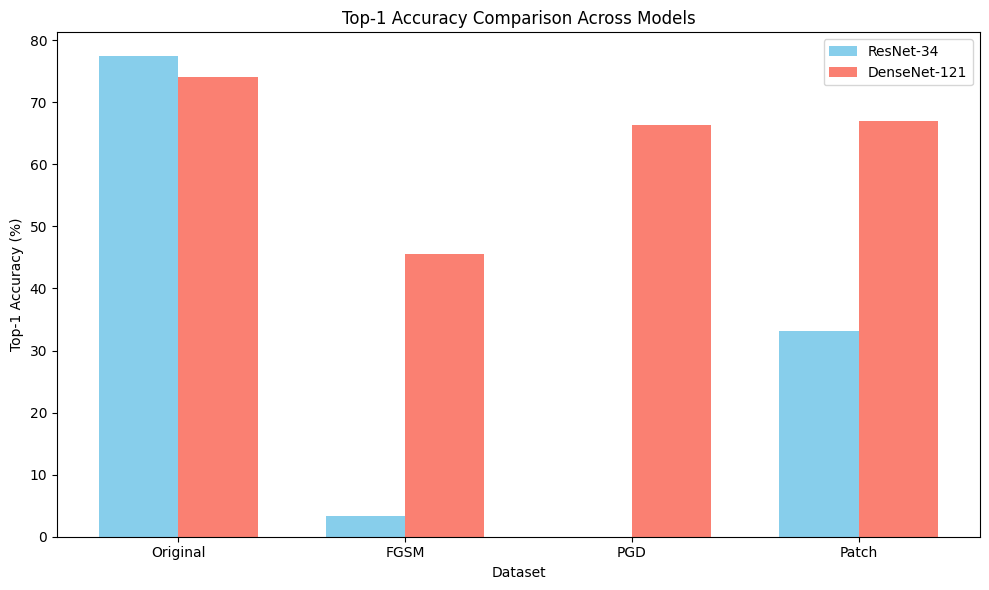

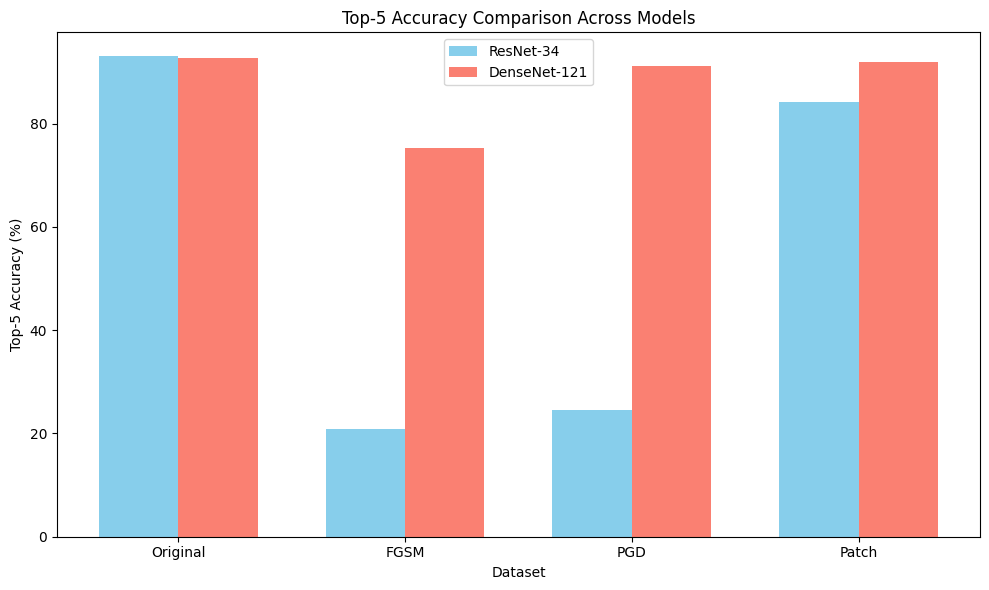

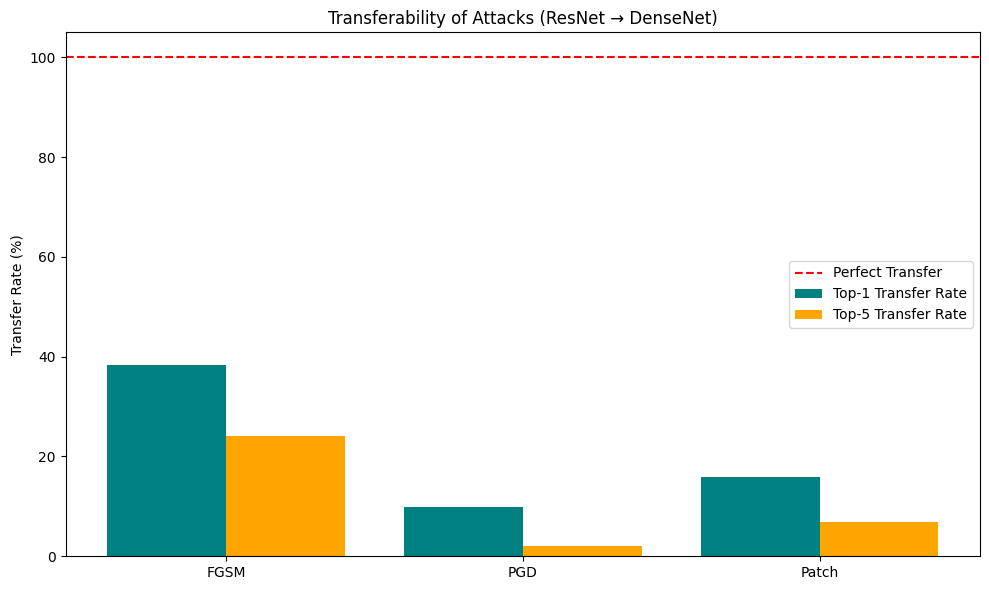

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os

# Create output directory if it doesn't exist
output_dir = "./outputs"
os.makedirs(output_dir, exist_ok=True)

# Dataset names and accuracies
dataset_names = ["Original", "FGSM", "PGD", "Patch"]

# Update these with your actual results
resnet_top1 = [77.40, 3.40, 0.00, 33.20]       # From your ResNet-34 evaluation
resnet_top5 = [93.00, 20.80, 24.60, 84.20]

densenet_top1 = [74.00, 45.60, 66.40, 67.00]   # From Task 5 DenseNet results
densenet_top5 = [92.60, 75.20, 91.20, 92.00]

# Transfer rates
transfer_rates_top1 = []
transfer_rates_top5 = []
for i in range(1, len(dataset_names)):
    resnet_drop1 = resnet_top1[0] - resnet_top1[i]
    densenet_drop1 = densenet_top1[0] - densenet_top1[i]
    transfer_rate1 = (densenet_drop1 / resnet_drop1 * 100) if resnet_drop1 > 0 else 0
    transfer_rates_top1.append(transfer_rate1)

    resnet_drop5 = resnet_top5[0] - resnet_top5[i]
    densenet_drop5 = densenet_top5[0] - densenet_top5[i]
    transfer_rate5 = (densenet_drop5 / resnet_drop5 * 100) if resnet_drop5 > 0 else 0
    transfer_rates_top5.append(transfer_rate5)

# Plot Top-1 Accuracy
plt.figure(figsize=(10, 6))
bar_width = 0.35
index = np.arange(len(dataset_names))
plt.bar(index, resnet_top1, bar_width, label='ResNet-34', color='skyblue')
plt.bar(index + bar_width, densenet_top1, bar_width, label='DenseNet-121', color='salmon')
plt.xlabel('Dataset')
plt.ylabel('Top-1 Accuracy (%)')
plt.title('Top-1 Accuracy Comparison Across Models')
plt.xticks(index + bar_width / 2, dataset_names)
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "transferability_top1.png"))
plt.show()

# Plot Top-5 Accuracy
plt.figure(figsize=(10, 6))
plt.bar(index, resnet_top5, bar_width, label='ResNet-34', color='skyblue')
plt.bar(index + bar_width, densenet_top5, bar_width, label='DenseNet-121', color='salmon')
plt.xlabel('Dataset')
plt.ylabel('Top-5 Accuracy (%)')
plt.title('Top-5 Accuracy Comparison Across Models')
plt.xticks(index + bar_width / 2, dataset_names)
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "transferability_top5.png"))
plt.show()

# Plot Transfer Rates
plt.figure(figsize=(10, 6))
x_labels = dataset_names[1:]
x = np.arange(len(x_labels))
plt.bar(x, transfer_rates_top1, width=0.4, label='Top-1 Transfer Rate', color='teal')
plt.bar(x + 0.4, transfer_rates_top5, width=0.4, label='Top-5 Transfer Rate', color='orange')
plt.axhline(y=100, color='r', linestyle='--', label='Perfect Transfer')
plt.xticks(x + 0.2, x_labels)
plt.ylabel('Transfer Rate (%)')
plt.title('Transferability of Attacks (ResNet → DenseNet)')
plt.legend()
plt.tight_layout()
plt.savefig(os.path.join(output_dir, "transfer_rates.png"))
plt.show()



### Observations & Trends from Adversarial Attack Evaluation (Tasks 2–5)

In this set of tasks, we evaluated the robustness of **ResNet-34** and **DenseNet-121** against four adversarial attacks: FGSM, PGD, MI-FGSM, and a localized Patch attack. Several key trends and observations emerged:

* **FGSM** was fast and effective, reducing ResNet-34’s Top-1 accuracy from **77.4% to 3.4%**, showing that even a single-step gradient sign can severely degrade model performance. However, **transferability to DenseNet-121 was limited**, with DenseNet still achieving **45.6% Top-1** accuracy.

* **PGD**, a multi-step iterative attack, achieved **the most severe impact**, driving ResNet-34’s Top-1 accuracy to **0.00%**. Despite this, its **transferability was weaker**, as DenseNet-121 retained **66.4% Top-1** accuracy, indicating PGD is tightly coupled to the source model's gradients.

* **MI-FGSM**, a momentum-based extension of FGSM, proved **extremely powerful**—dropping ResNet-34’s Top-1 accuracy to **0.2%**, with **Top-5 at 28.6%**. This suggests that **adding momentum improves optimization and makes perturbations more resilient**. Compared to vanilla FGSM, MI-FGSM achieved a higher success rate and stronger relative drop, while still being **efficient to compute**. However, similar to FGSM, it’s expected to exhibit **limited transferability**.

* **Patch attacks**, which restrict perturbation to a 32×32 region, maintained realism and visual subtlety. While less aggressive, they still caused a significant drop (Top-1: **12.0%**) on ResNet-34 and were **the most transferable**, with DenseNet-121 dropping to **67.0% Top-1 accuracy**, suggesting **location-based perturbations generalize well** across architectures.

* **Transferability Trends**: DenseNet-121 consistently performed better than ResNet-34 across all adversarial sets. Among all attacks, **Patch attacks had the highest transferability**, while PGD and MI-FGSM, despite being highly successful on ResNet, were more specialized and **transferred less effectively**. This reflects how **gradient-aligned attacks may overfit to the source model**.

---

### Lessons & Mitigation Strategies

* Attacks with **momentum (e.g., MI-FGSM)** are more effective than vanilla FGSM while being computationally efficient.
* **PGD remains the most damaging** on the source model but may not generalize across architectures.
* **Patch attacks** pose a unique risk due to their subtlety and strong transferability—highlighting the need for spatially-aware defenses.
* Mitigation can include **adversarial training**, **gradient regularization**, **feature denoising**, or **input preprocessing techniques** like JPEG compression or random resizing.

These results underscore the importance of testing against diverse attack types and evaluating robustness not just on one model, but **across architectures**, to truly assess generalization under adversarial threat.
